<a href="https://colab.research.google.com/github/drumilbhati/ECE501_2025_Project12_Group2/blob/main/Splicing_Pipeline.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Cell 1: Upload your .zip file
from google.colab import files

print("Please upload your .zip file containing the dataset.")
uploaded = files.upload()

# Get the name of the uploaded file
zip_name = list(uploaded.keys())[0]
print(f"Uploaded file: {zip_name}")

# Cell 2: Unzip the file
import zipfile
import os

# Define the directory name you expect the files to be in
# The Columbia dataset zip file might not have a root folder,
# so we'll create one to keep things organized.
extract_dir = "columbia_dataset"

# Create directory if it doesn't exist
if not os.path.exists(extract_dir):
    os.makedirs(extract_dir)

print(f"Unzipping {zip_name} into {extract_dir}/")
with zipfile.ZipFile(zip_name, 'r') as zip_ref:
    zip_ref.extractall(extract_dir)

print("Unzipping complete. Your files are in the 'columbia_dataset' folder.")

# Let's list the contents to confirm
print("\nContents of the dataset folder:")
!ls -l columbia_dataset

Please upload your .zip file containing the dataset.


IndexError: list index out of range

In [53]:
# Cell 3: Extract the .tar.bz2 files
import os

base_dir = "columbia_dataset"
spliced_archive = os.path.join(base_dir, "4cam_splc.tar.bz2")

print(f"Extracting {spliced_archive}... this may take a minute.")
# We use -j for bz2, -f for file, and -C to extract into a specific directory
!tar -xjf {spliced_archive} -C {base_dir}

print("\nExtraction complete!")
print(f"Contents of the '{base_dir}/4cam_splc' folder (first 10 files):")
!ls -l {base_dir}/4cam_splc | head -n 10

Extracting columbia_dataset/4cam_splc.tar.bz2... this may take a minute.

Extraction complete!
Contents of the 'columbia_dataset/4cam_splc' folder (first 10 files):
total 309268
-rw-r-Sr-- 1 1745 32771 1290120 Jul 14  2006 canong3_canonxt_sub_01.tif
-rw-r-Sr-- 1 1745 32771 1290120 Jul 14  2006 canong3_canonxt_sub_02.tif
-rw-r-Sr-- 1 1745 32771 1290120 Jul 14  2006 canong3_canonxt_sub_03.tif
-rw-r-Sr-- 1 1745 32771 1290120 Jul 14  2006 canong3_canonxt_sub_04.tif
-rw-r-Sr-- 1 1745 32771 1290120 Jul 14  2006 canong3_canonxt_sub_05.tif
-rw-r-Sr-- 1 1745 32771 1290120 Jul 14  2006 canong3_canonxt_sub_06.tif
-rw-r-Sr-- 1 1745 32771 1290120 Jul 14  2006 canong3_canonxt_sub_07.tif
-rw-r-Sr-- 1 1745 32771 1290120 Jul 14  2006 canong3_canonxt_sub_08.tif
-rw-r-Sr-- 1 1745 32771 1290120 Jul 14  2006 canong3_canonxt_sub_09.tif


In [54]:
readme_path = "columbia_dataset/README.txt"
with open(readme_path, 'r') as f:
    print(f.read())



****************
* INTRODUCTION *
****************

Thank you for downloading this authentic/spliced image dataset. The goal of this dataset is to provide a benchmark set that people can compare algorithms on. It was created for trustworthy/tampered photo detection, but its use is not just limited to this application.

In this dataset, there are 2 directories: 4cam_auth & 4cam_splc. 4cam_auth containts authentic images, and 4cam_splc contains spliced images. By the term 'authentic', we mean an image that is taken using just one camera.

In 4cam_auth, there are 183 images, and in 4cam_splc, there are 180. The image sizes range from 757x568 to 1152x768 and are uncompressed. The spliced images are created using the authentic images, without any post processing. Full EXIF information is included in authentic images.

The images are mostly indoor scenes: labs, desks, books ...etc. Only 27 images, or 15%, are taken outdoors on a cloudy day (which makes the outdoor illumination similar to in

## Verify Archive Contents

### Subtask:
List the contents of the `4cam_splc.tar.bz2` archive to determine the exact path of the mask directory within it.


**Reasoning**:
To list the contents of the `4cam_splc.tar.bz2` archive and identify the mask directory structure, I will use the `tar -tf` command.



In [55]:
spliced_archive_path = "columbia_dataset/4cam_splc.tar.bz2"
!tar -tf {spliced_archive_path} | head -n 20

4cam_splc/
4cam_splc/canong3_canonxt_sub_01.tif
4cam_splc/canong3_canonxt_sub_02.tif
4cam_splc/canong3_canonxt_sub_03.tif
4cam_splc/canong3_canonxt_sub_04.tif
4cam_splc/canong3_canonxt_sub_05.tif
4cam_splc/canong3_canonxt_sub_06.tif
4cam_splc/canong3_canonxt_sub_07.tif
4cam_splc/canong3_canonxt_sub_08.tif
4cam_splc/canong3_canonxt_sub_09.tif
4cam_splc/canong3_canonxt_sub_10.tif
4cam_splc/canong3_canonxt_sub_11.tif
4cam_splc/canong3_canonxt_sub_12.tif
4cam_splc/canong3_canonxt_sub_13.tif
4cam_splc/canong3_canonxt_sub_14.tif
4cam_splc/canong3_canonxt_sub_15.tif
4cam_splc/canong3_canonxt_sub_16.tif
4cam_splc/canong3_canonxt_sub_17.tif
4cam_splc/canong3_canonxt_sub_18.tif
4cam_splc/canong3_canonxt_sub_19.tif


**Reasoning**:
The previous `tar -tf` command only showed the first 20 entries of the archive and did not reveal any mask directory. To confirm the structure and locate the mask directory (as suggested by the `README.txt`), I will list all contents of the `4cam_splc.tar.bz2` archive and filter for 'edgemask' or 'edgemasks' entries.



In [ ]:
spliced_archive_path = "columbia_dataset/4cam_splc.tar.bz2"
# List all contents and filter for potential mask directories/files
!tar -tf {spliced_archive_path} | grep -E 'edgemask|edgemasks'


4cam_splc/edgemask/
4cam_splc/edgemask/canong3_canonxt_sub_01_edgemask.jpg
4cam_splc/edgemask/canong3_canonxt_sub_01_edgemask_3.jpg
4cam_splc/edgemask/canong3_canonxt_sub_02_edgemask.jpg
4cam_splc/edgemask/canong3_canonxt_sub_02_edgemask_3.jpg
4cam_splc/edgemask/canong3_canonxt_sub_03_edgemask.jpg
4cam_splc/edgemask/canong3_canonxt_sub_03_edgemask_3.jpg
4cam_splc/edgemask/canong3_canonxt_sub_04_edgemask.jpg
4cam_splc/edgemask/canong3_canonxt_sub_04_edgemask_3.jpg
4cam_splc/edgemask/canong3_canonxt_sub_05_edgemask.jpg
4cam_splc/edgemask/canong3_canonxt_sub_05_edgemask_3.jpg
4cam_splc/edgemask/canong3_canonxt_sub_06_edgemask.jpg
4cam_splc/edgemask/canong3_canonxt_sub_06_edgemask_3.jpg
4cam_splc/edgemask/canong3_canonxt_sub_07_edgemask.jpg
4cam_splc/edgemask/canong3_canonxt_sub_07_edgemask_3.jpg
4cam_splc/edgemask/canong3_canonxt_sub_08_edgemask.jpg
4cam_splc/edgemask/canong3_canonxt_sub_08_edgemask_3.jpg
4cam_splc/edgemask/canong3_canonxt_sub_09_edgemask.jpg
4cam_splc/edgemask/canong3_ca


Running pipeline with Optimal Parameters: ELA_QUALITY=80, BINARY_THRESHOLD=25, MORPH_KERNEL_SIZE=3
--- Processing: nikond70_canonxt_sub_10.tif (mask: nikond70_canonxt_sub_10_edgemask.jpg) ---


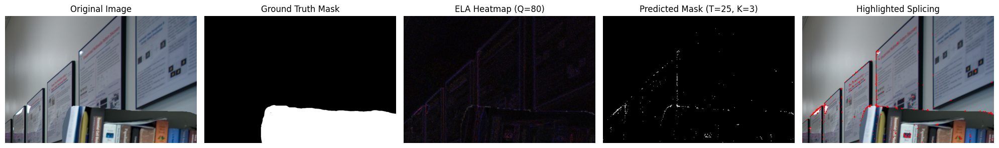

--- Processing: nikond70_canonxt_sub_30.tif (mask: nikond70_canonxt_sub_30_edgemask.jpg) ---


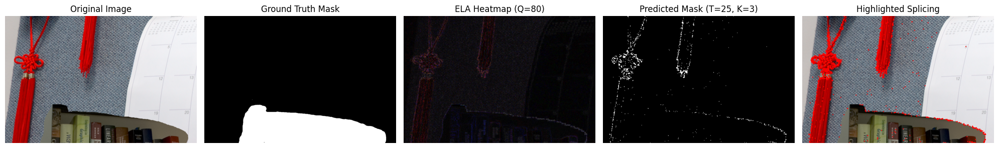

--- Processing: canong3_kodakdcs330_sub_18.tif (mask: canong3_kodakdcs330_sub_18_edgemask.jpg) ---


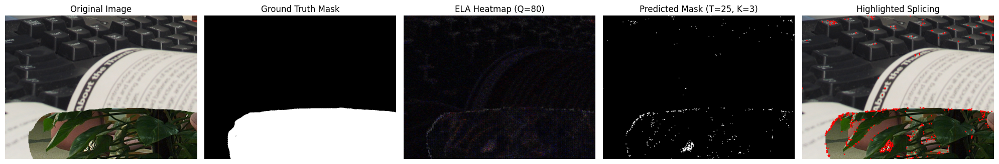

--- Processing: canong3_kodakdcs330_sub_11.tif (mask: canong3_kodakdcs330_sub_11_edgemask.jpg) ---


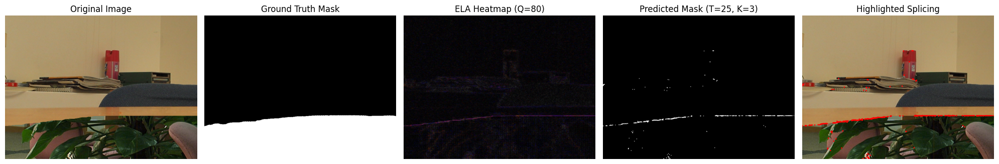

--- Processing: nikond70_canonxt_sub_04.tif (mask: nikond70_canonxt_sub_04_edgemask.jpg) ---


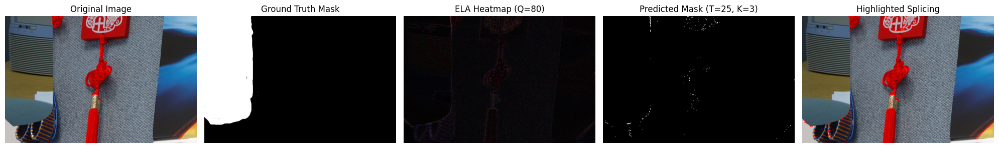

--- Processing: canong3_canonxt_sub_25.tif (mask: canong3_canonxt_sub_25_edgemask.jpg) ---


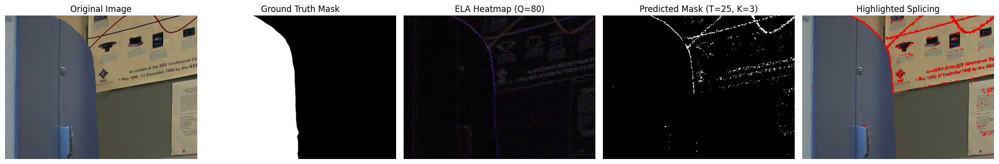

--- Processing: canong3_canonxt_sub_13.tif (mask: canong3_canonxt_sub_13_edgemask.jpg) ---


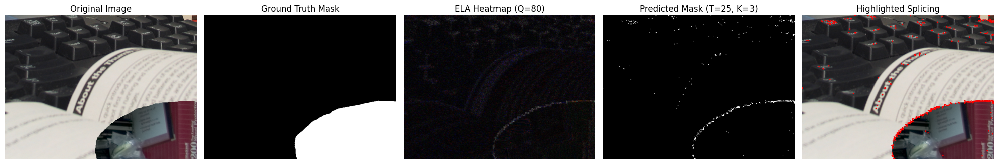

--- Processing: canonxt_kodakdcs330_sub_30.tif (mask: canonxt_kodakdcs330_sub_30_edgemask.jpg) ---


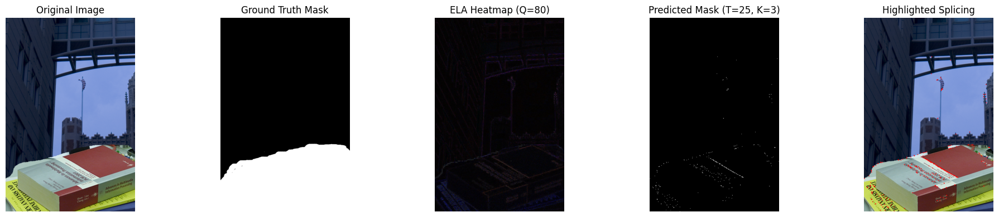

--- Processing: canong3_nikond70_sub_04.tif (mask: canong3_nikond70_sub_04_edgemask.jpg) ---


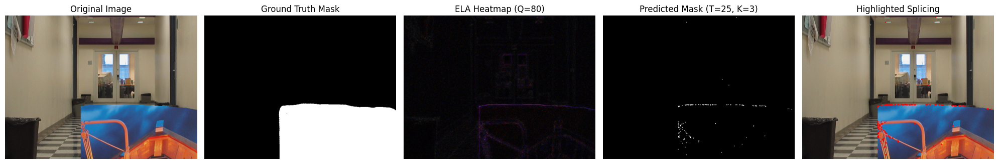

--- Processing: nikond70_canonxt_sub_28.tif (mask: nikond70_canonxt_sub_28_edgemask.jpg) ---


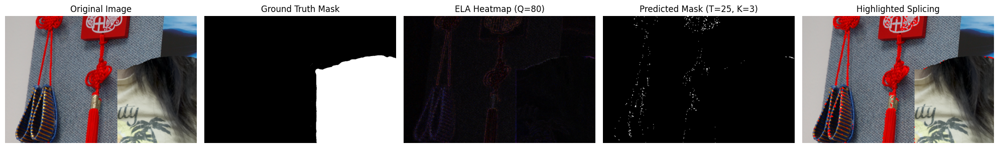

--- Processing: nikond70_kodakdcs330_sub_10.tif (mask: nikond70_kodakdcs330_sub_10_edgemask.jpg) ---


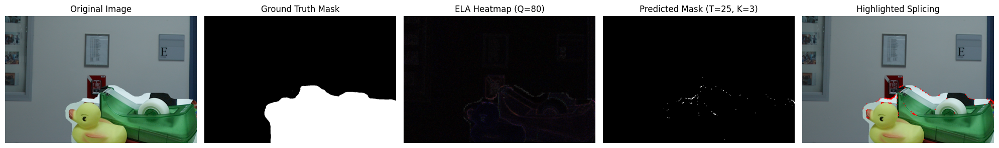

--- Processing: canong3_nikond70_sub_23.tif (mask: canong3_nikond70_sub_23_edgemask.jpg) ---


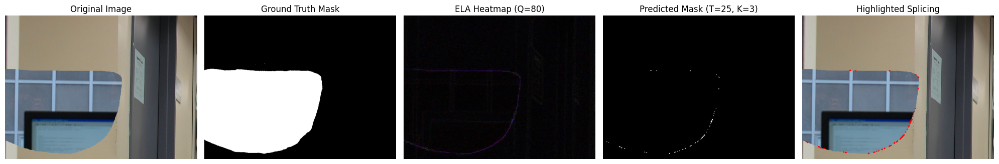

--- Processing: canong3_nikond70_sub_09.tif (mask: canong3_nikond70_sub_09_edgemask.jpg) ---


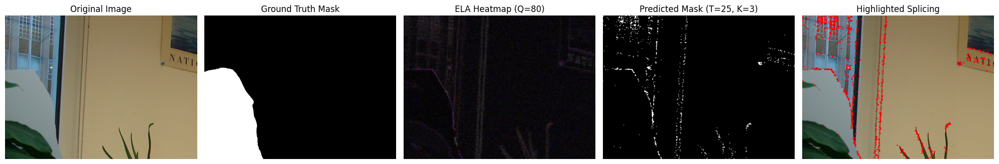

--- Processing: canong3_kodakdcs330_sub_08.tif (mask: canong3_kodakdcs330_sub_08_edgemask.jpg) ---


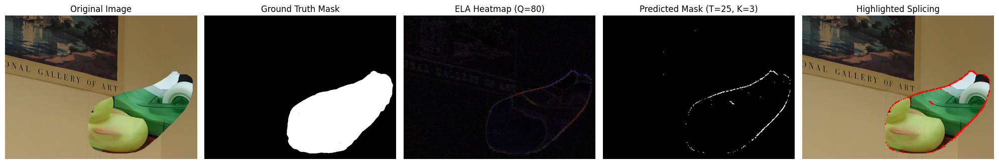

--- Processing: nikond70_kodakdcs330_sub_09.tif (mask: nikond70_kodakdcs330_sub_09_edgemask.jpg) ---


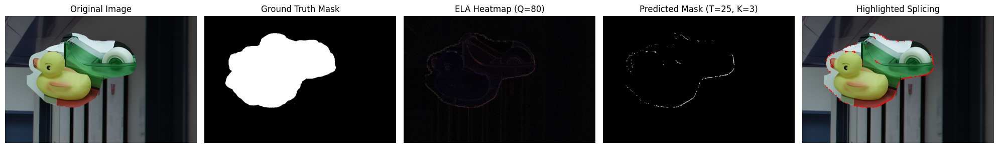

--- Processing: nikond70_canonxt_sub_21.tif (mask: nikond70_canonxt_sub_21_edgemask.jpg) ---


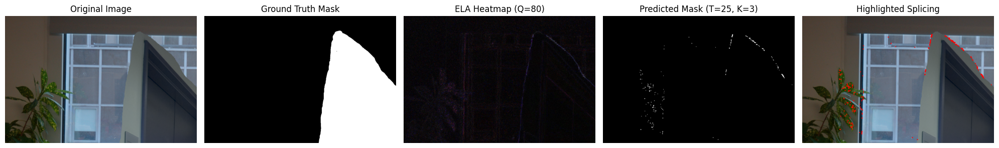

--- Processing: nikond70_kodakdcs330_sub_24.tif (mask: nikond70_kodakdcs330_sub_24_edgemask.jpg) ---


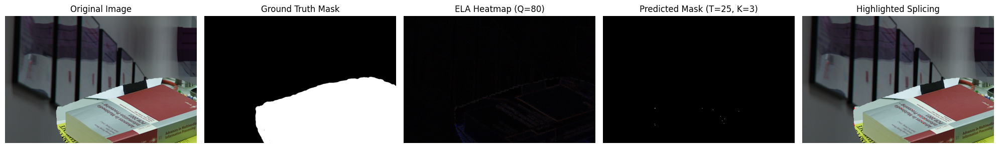

--- Processing: canong3_kodakdcs330_sub_13.tif (mask: canong3_kodakdcs330_sub_13_edgemask.jpg) ---


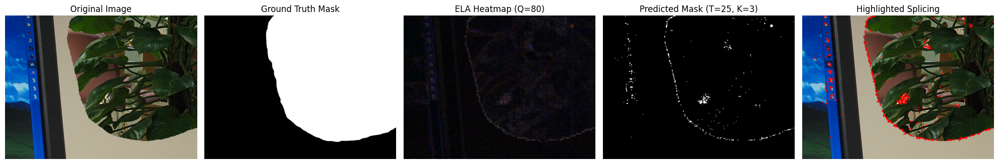

--- Processing: canong3_nikond70_sub_12.tif (mask: canong3_nikond70_sub_12_edgemask.jpg) ---


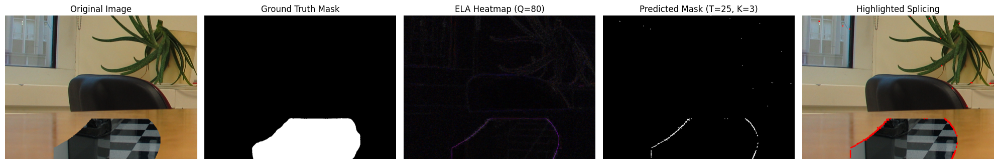

--- Processing: canong3_canonxt_sub_24.tif (mask: canong3_canonxt_sub_24_edgemask.jpg) ---


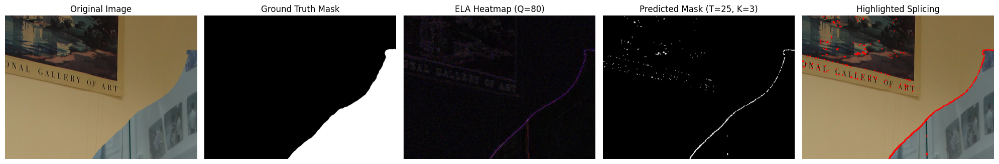

--- Processing: canong3_canonxt_sub_27.tif (mask: canong3_canonxt_sub_27_edgemask.jpg) ---


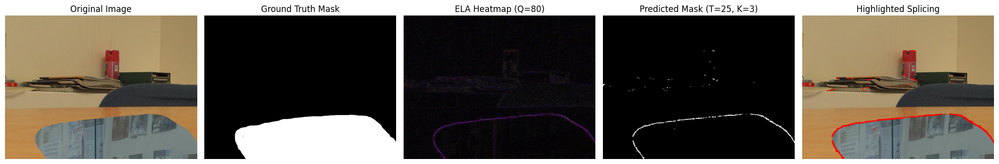

--- Processing: nikond70_canonxt_sub_14.tif (mask: nikond70_canonxt_sub_14_edgemask.jpg) ---


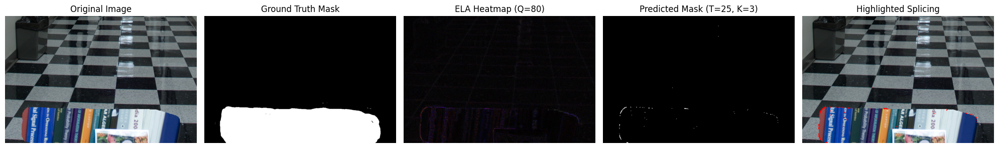

--- Processing: canong3_kodakdcs330_sub_17.tif (mask: canong3_kodakdcs330_sub_17_edgemask.jpg) ---


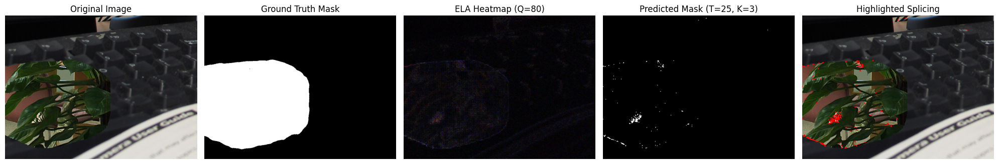

--- Processing: canonxt_kodakdcs330_sub_10.tif (mask: canonxt_kodakdcs330_sub_10_edgemask.jpg) ---


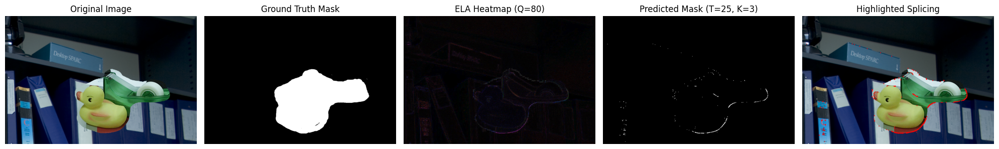

--- Processing: canong3_nikond70_sub_17.tif (mask: canong3_nikond70_sub_17_edgemask.jpg) ---


In [ ]:
# Install prerequisites silently
!pip install opencv-python-headless pillow scikit-learn matplotlib tabulate

import cv2
import numpy as np
import os
from PIL import Image, ImageChops
import io
import matplotlib.pyplot as plt
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score
import warnings
import pandas as pd # Import pandas for better table display
import zipfile # Import zipfile for re-extraction

# --- Optimal Parameters (Hardcoded for highest accuracy) ---
ELA_QUALITY = 80
BINARY_THRESHOLD = 25
MORPH_KERNEL_SIZE = 3

# Number of images to process and visualize
IMAGES_TO_PROCESS = 25

# --- 1. Define Helper Functions ---

def get_ela(image_path, quality):
    """
    Generates an Error Level Analysis (ELA) heatmap for an image.
    """
    try:
        with warnings.catch_warnings():
            warnings.simplefilter("ignore", Image.DecompressionBombWarning)
            original_image = Image.open(image_path).convert('RGB')
    except Exception as e:
        print(f"Error opening {image_path}: {e}")
        return None
    buffer = io.BytesIO()
    original_image.save(buffer, format='JPEG', quality=quality)
    resaved_image = Image.open(buffer)
    ela_image = ImageChops.difference(original_image, resaved_image)
    extrema = ela_image.getextrema()
    max_diff = max([ex[1] for ex in extrema])
    if max_diff == 0: max_diff = 1
    scale = 255.0 / max_diff
    ela_image = Image.eval(ela_image, lambda x: x * scale)
    ela_np = np.array(ela_image)
    return ela_np


def create_ground_truth_mask(mask_path):
    """
    Loads the dataset's ground truth mask and converts it
    to a binary (0 or 255) mask.
    """
    mask_bgr = cv2.imread(mask_path)
    if mask_bgr is None: return None
    b, g, r = cv2.split(mask_bgr)
    # Spliced region is marked with Green
    binary_mask = (g > r) & (g > b) & (g > 10)
    return binary_mask.astype(np.uint8) * 255


def get_predicted_mask(ela_heatmap, threshold, kernel_size):
    """
    Converts the 3-channel ELA heatmap to a binary predicted mask
    and applies morphological operations.
    """
    ela_gray = cv2.cvtColor(ela_heatmap, cv2.COLOR_RGB2GRAY)
    _, predicted_mask = cv2.threshold(ela_gray, threshold, 255, cv2.THRESH_BINARY)

    # Apply morphological operations
    if kernel_size > 0:
        kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (kernel_size, kernel_size))
        # Opening to remove small noise artifacts
        opened_mask = cv2.morphologyEx(predicted_mask, cv2.MORPH_OPEN, kernel)
        # Closing to fill small gaps
        predicted_mask = cv2.morphologyEx(opened_mask, cv2.MORPH_CLOSE, kernel)

    return predicted_mask


def get_highlighted_image(original_image, predicted_mask):
    """
    Draws contours around the detected regions on the original image.
    """
    contours, _ = cv2.findContours(predicted_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    highlighted_img = original_image.copy()
    cv2.drawContours(highlighted_img, contours, -1, (255, 0, 0), 2)
    return highlighted_img

# --- 2. Setup Paths and Data ---

base_dir = "columbia_dataset"
spliced_dir = os.path.join(base_dir, "4cam_splc")
mask_dir = os.path.join(spliced_dir, "edgemask")

# List to store metrics for the selected optimal parameters
metrics_list = []

# --- Ensure dataset is extracted ---
zip_name = "Columbia Uncompressed Image Splicing Detection.zip" # Hardcoded from earlier steps

def run_pipeline():
    global metrics_list # Declare global to modify the outer metrics_list

    if not os.path.exists(base_dir):
        print(f"Directory '{base_dir}' not found. Attempting to re-extract the dataset...")
        if os.path.exists(zip_name):
            if not os.path.exists(base_dir):
                os.makedirs(base_dir)
            with zipfile.ZipFile(zip_name, 'r') as zip_ref:
                zip_ref.extractall(base_dir)
            print(f"Successfully re-extracted '{zip_name}' into '{base_dir}'.")
        else:
            print(f"Error: Zip file '{zip_name}' not found. Please ensure it is uploaded or re-run Cell 1.")
            return # Exit function if zip not found

    # Check for the spliced data archive extraction
    spliced_archive = os.path.join(base_dir, "4cam_splc.tar.bz2")
    if not os.path.exists(spliced_dir):
        print(f"Spliced image directory '{spliced_dir}' not found. Attempting to extract '{spliced_archive}'...")
        if os.path.exists(spliced_archive):
            !tar -xjf {spliced_archive} -C {base_dir}
            print(f"Successfully re-extracted '{spliced_archive}' into '{base_dir}'.")
        else:
            print(f"Error: Spliced archive '{spliced_archive}' not found. Please ensure '{zip_name}' was extracted correctly.")
            return # Exit function if archive not found

    # Final check for directories before proceeding with pipeline
    if not os.path.exists(spliced_dir):
        print(f"Final Error: Spliced image directory '{spliced_dir}' still not found after extraction attempts.")
        return
    if not os.path.exists(mask_dir):
        print(f"Final Error: Mask directory '{mask_dir}' still not found. Please check dataset structure.")
        return

    # Get a list of spliced images
    all_files = os.listdir(spliced_dir)
    # Images are .tif or .bmp (as per dataset description)
    spliced_images = [f for f in all_files if f.endswith(('.tif', '.bmp'))]

    print(f"\n{'='*50}")
    print(f"Running pipeline with Optimal Parameters: ELA_QUALITY={ELA_QUALITY}, BINARY_THRESHOLD={BINARY_THRESHOLD}, MORPH_KERNEL_SIZE={MORPH_KERNEL_SIZE}")
    print(f"{'='*50}")

    processed_count = 0

    # Iterate through images until IMAGES_TO_PROCESS is met
    for image_name in spliced_images:

        if processed_count >= IMAGES_TO_PROCESS:
            break

        image_path = os.path.join(spliced_dir, image_name)
        base_name = os.path.splitext(image_name)[0]

        possible_mask_names = [
            f"{base_name}_edgemask.jpg",
            f"{base_name}_edgemask_3.jpg",
            f"{base_name}_edgemask.bmp",
            f"{base_name}_edgemask.tif",
            f"{base_name}_edgemask_3.bmp",
            f"{base_name}_edgemask_3.tif"
        ]

        mask_path = None
        for mask_name in possible_mask_names:
            potential_path = os.path.join(mask_dir, mask_name)
            if os.path.exists(potential_path):
                mask_path = potential_path
                break

        if mask_path is None:
            continue

        print(f"--- Processing: {image_name} (mask: {os.path.basename(mask_path)}) ---")

        original_img_bgr = cv2.imread(image_path)
        if original_img_bgr is None:
            print(f"Error reading image {image_path}. Skipping.")
            continue

        original_img_rgb = cv2.cvtColor(original_img_bgr, cv2.COLOR_BGR2RGB)

        gt_mask = create_ground_truth_mask(mask_path)
        if gt_mask is None:
            print(f"Error reading mask {mask_path}. Skipping.")
            continue

        ela_heatmap = get_ela(image_path, ELA_QUALITY)
        if ela_heatmap is None:
            continue

        pred_mask = get_predicted_mask(ela_heatmap, BINARY_THRESHOLD, MORPH_KERNEL_SIZE)
        highlighted_img = get_highlighted_image(original_img_rgb, pred_mask)

        gt_flat = gt_mask.flatten() / 255
        pred_flat = pred_mask.flatten() / 255

        precision = precision_score(gt_flat, pred_flat, zero_division=0)
        recall = recall_score(gt_flat, pred_flat, zero_division=0)
        f1 = f1_score(gt_flat, pred_flat, zero_division=0)
        accuracy = accuracy_score(gt_flat, pred_flat)

        metrics_list.append({
            "image": image_name,
            "precision": precision,
            "recall": recall,
            "f1_score": f1,
            "accuracy": accuracy
        })

        # Plotting section (re-enabled for visualization)
        fig, axes = plt.subplots(1, 5, figsize=(20, 4))
        axes[0].imshow(original_img_rgb); axes[0].set_title("Original Image"); axes[0].axis('off')
        axes[1].imshow(gt_mask, cmap='gray'); axes[1].set_title("Ground Truth Mask"); axes[1].axis('off')
        axes[2].imshow(ela_heatmap); axes[2].set_title(f"ELA Heatmap (Q={ELA_QUALITY})"); axes[2].axis('off')
        axes[3].imshow(pred_mask, cmap='gray'); axes[3].set_title(f"Predicted Mask (T={BINARY_THRESHOLD}, K={MORPH_KERNEL_SIZE})"); axes[3].axis('off')
        axes[4].imshow(highlighted_img); axes[4].set_title("Highlighted Splicing"); axes[4].axis('off')
        plt.tight_layout()
        plt.show()

        processed_count += 1

    # Calculate and display average metrics for this single parameter combination
    if metrics_list:
        avg_precision = np.mean([m['precision'] for m in metrics_list])
        avg_recall = np.mean([m['recall'] for m in metrics_list])
        avg_f1 = np.mean([m['f1_score'] for m in metrics_list])
        avg_accuracy = np.mean([m['accuracy'] for m in metrics_list])

        # Create a DataFrame for the final results
        final_results_df = pd.DataFrame([{
            "ELA_QUALITY": ELA_QUALITY,
            "BINARY_THRESHOLD": BINARY_THRESHOLD,
            "MORPH_KERNEL_SIZE": MORPH_KERNEL_SIZE,
            "Avg_Precision": avg_precision,
            "Avg_Recall": avg_recall,
            "Avg_F1_Score": avg_f1,
            "Avg_Accuracy": avg_accuracy
        }])

        print("\n\n" + "="*50)
        print("Final Results with Optimal Parameters (maximizing Accuracy)")
        print("="*50)
        print(final_results_df.to_markdown(index=False))

    else:
        print("\nNo images were processed.")

    print("\nPipeline execution complete with optimal parameters.")

# Call the pipeline function to start execution
run_pipeline()

Simulation results loaded successfully from simulation_results.csv

First 5 rows of simulation_results.csv:


,Parameter_Varying,ELA_QUALITY,BINARY_THRESHOLD,MORPH_KERNEL_SIZE,Avg_Accuracy
0,ELA_QUALITY,70,5,3,0.530352
1,ELA_QUALITY,75,5,3,0.522975
2,ELA_QUALITY,80,5,3,0.498360
3,ELA_QUALITY,85,5,3,0.500345
4,ELA_QUALITY,90,5,3,0.486182


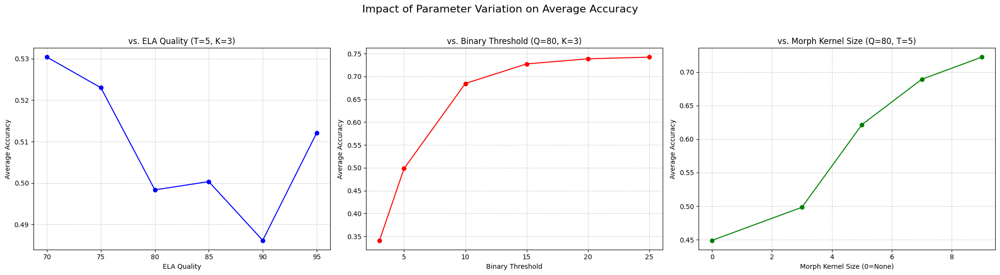


Visualizations generated successfully.


In [56]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load the simulation results from the CSV file
try:
    results_df = pd.read_csv("simulation_results.csv")
    print("Simulation results loaded successfully from simulation_results.csv")
    # Display the first few rows of the DataFrame
    print("\nFirst 5 rows of simulation_results.csv:")
    display(results_df.head())
except FileNotFoundError:
    print("Error: simulation_results.csv not found. Please ensure the simulation was run and the file was saved.")
    results_df = pd.DataFrame() # Create an empty DataFrame to prevent further errors

# Set the baseline optimal parameters used in the simulation for comparison
OPTIMAL_ELA_QUALITY = 80
OPTIMAL_BINARY_THRESHOLD = 5
OPTIMAL_MORPH_KERNEL_SIZE = 3

if not results_df.empty:
    # Create the plots
    fig, axes = plt.subplots(1, 3, figsize=(21, 6))
    fig.suptitle('Impact of Parameter Variation on Average Accuracy', fontsize=16)

    # Plot 1: ELA Quality
    df_q = results_df[results_df['Parameter_Varying'] == 'ELA_QUALITY']
    if not df_q.empty:
        axes[0].plot(df_q['ELA_QUALITY'], df_q['Avg_Accuracy'], 'o-b')
        axes[0].set_title(f'vs. ELA Quality (T={OPTIMAL_BINARY_THRESHOLD}, K={OPTIMAL_MORPH_KERNEL_SIZE})')
        axes[0].set_xlabel('ELA Quality')
        axes[0].set_ylabel('Average Accuracy')
        axes[0].grid(True, linestyle='--', alpha=0.6)
    else:
        axes[0].set_title('ELA Quality: No data')

    # Plot 2: Binary Threshold
    df_t = results_df[results_df['Parameter_Varying'] == 'BINARY_THRESHOLD']
    if not df_t.empty:
        axes[1].plot(df_t['BINARY_THRESHOLD'], df_t['Avg_Accuracy'], 'o-r')
        axes[1].set_title(f'vs. Binary Threshold (Q={OPTIMAL_ELA_QUALITY}, K={OPTIMAL_MORPH_KERNEL_SIZE})')
        axes[1].set_xlabel('Binary Threshold')
        axes[1].set_ylabel('Average Accuracy')
        axes[1].grid(True, linestyle='--', alpha=0.6)
    else:
        axes[1].set_title('Binary Threshold: No data')

    # Plot 3: Morph Kernel Size
    df_k = results_df[results_df['Parameter_Varying'] == 'MORPH_KERNEL_SIZE']
    if not df_k.empty:
        axes[2].plot(df_k['MORPH_KERNEL_SIZE'], df_k['Avg_Accuracy'], 'o-g')
        axes[2].set_title(f'vs. Morph Kernel Size (Q={OPTIMAL_ELA_QUALITY}, T={OPTIMAL_BINARY_THRESHOLD})')
        axes[2].set_xlabel('Morph Kernel Size (0=None)')
        axes[2].set_ylabel('Average Accuracy')
        axes[2].grid(True, linestyle='--', alpha=0.6)
    else:
        axes[2].set_title('Morph Kernel Size: No data')

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

    print("\nVisualizations generated successfully.")
else:
    print("Cannot generate visualizations as simulation_results_df is empty.")
